## 4. Data Cleaning

**Exploratory Data Analysis (EDA)** is an approach to analysing data sets to summarize their main characteristics, often with visual methods. Following are the different steps involved in EDA :
1. Data Collection
2. Data Cleaning
3. Data Preprocessing
4. Data Visualisation

First we will import all the relevant dependencies we need.

In [1]:
# Import Dependencies
%matplotlib inline

# Start Python Imports
import math, time, random, datetime
# pip install pandas-profiling,pip install missing from anaconda prompt
# Data Manipulation
import numpy as np
import pandas as pd
import re
# Visualization 
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pp
import missingno
# Data Scraping
import requests
from bs4 import BeautifulSoup
import warnings
warnings.filterwarnings('ignore')

C:\Users\babay\Anaconda3\lib\site-packages\pandas_profiling\plot.py:15: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\Users\babay\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\babay\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\babay\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\babay\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\babay\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 486, in start
    self.io_loop.start()
  File "C:\Users\bab

We need to get data into the notebook. We can define our directory than we can read our file.

In [2]:
pd.set_option('display.max_columns', None) # Display all columns
pd.set_option('display.max_colwidth', -1)  # Display all values

In [3]:
cols = ["location", "floor", "title", "price", "age", "area_m2", "owner", "room","seller","date"]
df = pd.read_csv("hurriyetemlak_dirty.csv",skiprows=1, names=cols) 
# We can define the columns name  by "names" parameter, and we can ignore first column

In [4]:
df

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32329741,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32253338,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,/konut-kiralik/istanbul-besiktas-bebek-emlakcidan-daire/detay/32351555,1. Kat,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,/konut-kiralik/istanbul-fatih-seyyid-omer-emlakcidan-daire/detay/32388828,3. Kat,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,/konut-kiralik/istanbul-beylikduzu-adnan-kahveci-emlakcidan-daire/detay/32408618,9. Kat,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018
5,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32371260,1. Kat,YENİ ULUS SİTESİ\u0027NDE HAVUZBAŞI KONUMDA FIRSAT DAİRE!,7.25,23.0,223.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
6,/konut-kiralik/istanbul-sariyer-maslak-emlakcidan-daire/detay/32372641,15. Kat,Maslak Mashattan Modern Eşyalı 3+1 Kiralik Daire (97),8.15,12.0,170.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
7,/konut-kiralik/istanbul-sariyer-maslak-emlakcidan-daire/detay/32244173,15. Kat,Maslak Mashattan 3+1 Kiralık Residence 15.Kat Manzara \u0026 Ankastre,6.00,9.0,170.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
8,/konut-kiralik/istanbul-sariyer-maslak-emlakcidan-daire/detay/32010746,21 ve üzeri,"MASHATTAN KIRALIK DAIRE, 4+1 GENIS MANZARALI RESIDENCE",9.50,9.0,255.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
9,/konut-kiralik/istanbul-kadikoy-kozyatagi-emlakcidan-daire/detay/32383725,2. Kat,KOZYATAĞI SIFIR 3+1 KOMBİ SPOTIŞIK KLİMA PANJUR ŞIKBANYOLU ŞIKMU,2.30,0.0,90.0,Emlakçıdan,3+1,Bireysel,09.12.2018


* When dealing with real-world data, dirty data is the norm rather than the exception. We continuously need to predict correct values, impute missing ones, and find links between various data artefacts such as schemas and records. 

* The primary goal of data cleaning is to detect and remove errors and anomalies to increase the value of data in analytics and decision making. While it has been the focus of many researchers for several years, individual problems have been addressed separately. **These include missing value imputation, outliers detection, transformations, integrity constraints violations detection and repair, consistent query answering, deduplication, and many other related problems such as profiling and constraints mining**

### What missing values are there?
* Where are the holes in our data?
* These are rows which are missing a value or have NaN instead of something like the rest of the column.

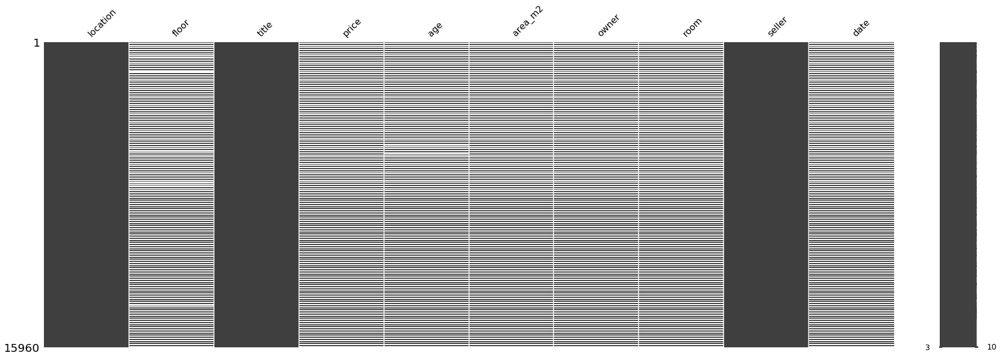

In [5]:
# Plot graphic of missing values
missingno.matrix(df, figsize = (30,10))

* Ok we can clearly see a lot of missing values here. This is not normal.
* If we look at our dataset, there is something wrong with it, after 20 rows, the dataset repeat itself with missing values
* It's important to visualise missing values early so you know where the major holes are in your dataset.
* Knowing this informaiton will help with your EDA and figuring out what kind of data cleaning and preprocessing is needed.

In [6]:
df

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32329741,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32253338,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,/konut-kiralik/istanbul-besiktas-bebek-emlakcidan-daire/detay/32351555,1. Kat,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,/konut-kiralik/istanbul-fatih-seyyid-omer-emlakcidan-daire/detay/32388828,3. Kat,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,/konut-kiralik/istanbul-beylikduzu-adnan-kahveci-emlakcidan-daire/detay/32408618,9. Kat,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018
5,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32371260,1. Kat,YENİ ULUS SİTESİ\u0027NDE HAVUZBAŞI KONUMDA FIRSAT DAİRE!,7.25,23.0,223.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
6,/konut-kiralik/istanbul-sariyer-maslak-emlakcidan-daire/detay/32372641,15. Kat,Maslak Mashattan Modern Eşyalı 3+1 Kiralik Daire (97),8.15,12.0,170.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
7,/konut-kiralik/istanbul-sariyer-maslak-emlakcidan-daire/detay/32244173,15. Kat,Maslak Mashattan 3+1 Kiralık Residence 15.Kat Manzara \u0026 Ankastre,6.00,9.0,170.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
8,/konut-kiralik/istanbul-sariyer-maslak-emlakcidan-daire/detay/32010746,21 ve üzeri,"MASHATTAN KIRALIK DAIRE, 4+1 GENIS MANZARALI RESIDENCE",9.50,9.0,255.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
9,/konut-kiralik/istanbul-kadikoy-kozyatagi-emlakcidan-daire/detay/32383725,2. Kat,KOZYATAĞI SIFIR 3+1 KOMBİ SPOTIŞIK KLİMA PANJUR ŞIKBANYOLU ŞIKMU,2.30,0.0,90.0,Emlakçıdan,3+1,Bireysel,09.12.2018


In [7]:
df.dropna(thresh=6,inplace=True) # Keep At least six values is not null value

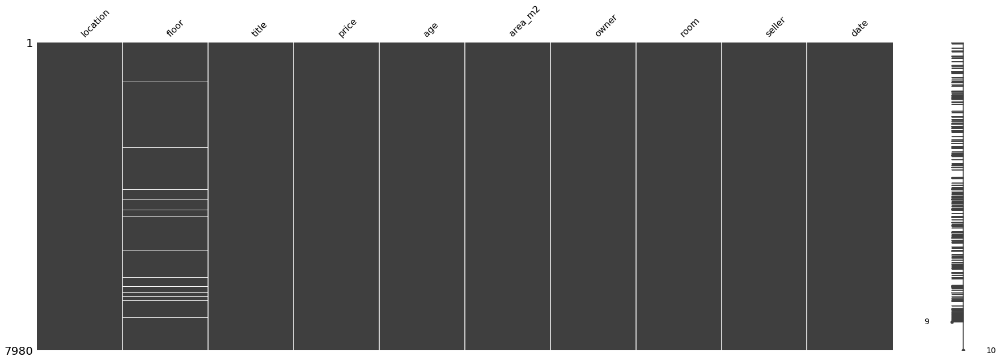

In [8]:
# Plot graphic of missing values
missingno.matrix(df, figsize = (30,10))

* Now  we have some missing value on floor.  

In [9]:
# Let's write a little function to show us how many missing values
# there are
def find_missing_values(df, columns):
    """
    Finds number of rows where certain columns are missing values.
    ::param_df:: = target dataframe
    ::param_columns:: = list of columns
    """
    missing_vals = {}
    print("Number of missing or NaN values for each column:")
    df_length = len(df)
    for column in columns:
        total_column_values = df[column].value_counts().sum()
        missing_vals[column] = df_length-total_column_values
        #missing_vals.append(str(column)+ " column has {} missing or NaN values.".format())
    return missing_vals

missing_values = find_missing_values(df, columns=df.columns)
missing_values

Number of missing or NaN values for each column:


{'location': 0,
 'floor': 215,
 'title': 0,
 'price': 0,
 'age': 4,
 'area_m2': 0,
 'owner': 0,
 'room': 0,
 'seller': 0,
 'date': 0}

We can get the same result with a single code

In [10]:
df.isnull().sum()

location    0  
floor       215
title       0  
price       0  
age         4  
area_m2     0  
owner       0  
room        0  
seller      0  
date        0  
dtype: int64

There are several ways to deal with missing data :
Ignore the data row
data.dropna(inplace = True)
Sometimes, we can delete or drop the row only if all the values are Nan
data.dropna(how='all')  
Use fillna() to fill missing values
data.fillna(method='ffill')

* data.fillna(methods = 'bfill')
* data.fillna(value=0, inplace=True)
* data['Embarked'].fillna('missing', inplace=True) 
* train_data['Age'].fillna(train_data['Age'].median(), inplace = True)
* train_data['Age'].fillna(train_data['Age'].mean(), inplace = True)
* train_data['Embarked'].fillna(train_data['Embarked'].mode()[0], inplace = True)

In [11]:
df.loc[:,df.isnull().any()].head() # the columns have missings value

,floor,age
0,3. Kat,3.0
1,Giriş Katı,4.0
2,1. Kat,40.0
3,3. Kat,35.0
4,9. Kat,7.0


In [12]:
df.loc[:,df.notnull().all()].head() # the columns have no missing value

,location,title,price,area_m2,owner,room,seller,date
0,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32329741,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32253338,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,/konut-kiralik/istanbul-besiktas-bebek-emlakcidan-daire/detay/32351555,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,/konut-kiralik/istanbul-fatih-seyyid-omer-emlakcidan-daire/detay/32388828,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,/konut-kiralik/istanbul-beylikduzu-adnan-kahveci-emlakcidan-daire/detay/32408618,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018


In [13]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32329741,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32253338,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,/konut-kiralik/istanbul-besiktas-bebek-emlakcidan-daire/detay/32351555,1. Kat,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,/konut-kiralik/istanbul-fatih-seyyid-omer-emlakcidan-daire/detay/32388828,3. Kat,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,/konut-kiralik/istanbul-beylikduzu-adnan-kahveci-emlakcidan-daire/detay/32408618,9. Kat,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018


In [14]:
df.tail() # We have to reset index

,location,floor,title,price,age,area_m2,owner,room,seller,date
15935,/konut-kiralik/istanbul-kadikoy-caddebostan-emlakcidan-daire/detay/32288209,9. Kat,VİZYON\u0027DAN CADDEBOSTANDA YENİ BİNADA HAVUZLU GÜVENLİKLİ ARAYANL,4.75,0.0,150.0,Emlakçıdan,3+1,Kurumsal,20.11.2018
15936,/konut-kiralik/istanbul-uskudar-ferah-emlakcidan-daire/detay/31954244,4. Kat,BORSA GAYRİMENKUL Ferah Mahallesinde Site İçinde Kiralık Daire,2.00,20.0,110.0,Emlakçıdan,3+1,Kurumsal,04.12.2018
15937,/konut-kiralik/istanbul-besiktas-arnavutkoy-emlakcidan-daire/detay/32402315,3. Kat,SECRETIVES\u0027TEN ARNAVUTKÖY\u0027DE FULL MANZARALI\u0026TERASLI-OTOPARKLI,15.00,30.0,200.0,Emlakçıdan,4+1,Kurumsal,07.12.2018
15938,/konut-kiralik/istanbul-uskudar-selamiali-emlakcidan-daire/detay/30533484,4. Kat,CADDE ÜSTÜ MANZARALI ORMAN İÇİ 2+1 KİRALIK DAİRE,2.00,28.0,90.0,Emlakçıdan,2+1,Kurumsal,05.12.2018
15939,/konut-kiralik/istanbul-besiktas-visnezade-emlakcidan-daire/detay/26266822,1. Kat,BEŞİKTAŞ VALİDEÇEŞMEDE 75 m2 1. KAT MASRAFSIZ,2.05,27.0,75.0,Emlakçıdan,1+1,Bireysel,07.12.2018


In [15]:
df.reset_index(drop=True, inplace=True) # We don't get the previous index

In [16]:
df.tail()

,location,floor,title,price,age,area_m2,owner,room,seller,date
7975,/konut-kiralik/istanbul-kadikoy-caddebostan-emlakcidan-daire/detay/32288209,9. Kat,VİZYON\u0027DAN CADDEBOSTANDA YENİ BİNADA HAVUZLU GÜVENLİKLİ ARAYANL,4.75,0.0,150.0,Emlakçıdan,3+1,Kurumsal,20.11.2018
7976,/konut-kiralik/istanbul-uskudar-ferah-emlakcidan-daire/detay/31954244,4. Kat,BORSA GAYRİMENKUL Ferah Mahallesinde Site İçinde Kiralık Daire,2.00,20.0,110.0,Emlakçıdan,3+1,Kurumsal,04.12.2018
7977,/konut-kiralik/istanbul-besiktas-arnavutkoy-emlakcidan-daire/detay/32402315,3. Kat,SECRETIVES\u0027TEN ARNAVUTKÖY\u0027DE FULL MANZARALI\u0026TERASLI-OTOPARKLI,15.00,30.0,200.0,Emlakçıdan,4+1,Kurumsal,07.12.2018
7978,/konut-kiralik/istanbul-uskudar-selamiali-emlakcidan-daire/detay/30533484,4. Kat,CADDE ÜSTÜ MANZARALI ORMAN İÇİ 2+1 KİRALIK DAİRE,2.00,28.0,90.0,Emlakçıdan,2+1,Kurumsal,05.12.2018
7979,/konut-kiralik/istanbul-besiktas-visnezade-emlakcidan-daire/detay/26266822,1. Kat,BEŞİKTAŞ VALİDEÇEŞMEDE 75 m2 1. KAT MASRAFSIZ,2.05,27.0,75.0,Emlakçıdan,1+1,Bireysel,07.12.2018


In [17]:
df.columns

Index(['location', 'floor', 'title', 'price', 'age', 'area_m2', 'owner',
       'room', 'seller', 'date'],
      dtype='object')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7980 entries, 0 to 7979
Data columns (total 10 columns):
location    7980 non-null object
floor       7765 non-null object
title       7980 non-null object
price       7980 non-null float64
age         7976 non-null float64
area_m2     7980 non-null float64
owner       7980 non-null object
room        7980 non-null object
seller      7980 non-null object
date        7980 non-null object
dtypes: float64(3), object(7)
memory usage: 623.5+ KB


In [19]:
df.describe()

,price,age,area_m2
count,7980.000000,7976.000000,7980.000000
mean,38.682010,14.641800,127.303383
std,165.979066,13.454736,59.284712
min,1.000000,0.000000,1.000000
25%,1.600000,3.000000,90.000000
50%,2.300000,13.000000,120.000000
75%,4.100000,25.000000,150.000000
max,990.000000,140.000000,1150.000000


### Let's explore each of these features individually
We'll go through each column iteratively and see what we can do.

#### Location

* First impression is;  "location" feature will give us hard time to analyse the whole data. 
* In order to see the untruncated version of "location" we can have a quick look at the first house.

In [20]:
df["location"][0]

'/konut-kiralik/istanbul-besiktas-ulus-emlakcidan-daire/detay/32329741'

* We know that all houses are for rent and they are all in Istanbul, so we do not need extra info on it.
* We know that there is an extra column to show owner and selller,so we do not need extra info on it.
* We do not need advertisement id number.

In [21]:
# https://goo.gl/9dLsR3
df["location"]=df["location"].str.replace("/konut-kiralik/istanbul-", "")

In [22]:
df["location"]=df["location"].str.replace("-emlakcidan-daire/detay/", "")

In [23]:
# https://docs.python.org/3/library/re.html#re-syntax
# https://jakevdp.github.io/WhirlwindTourOfPython/14-strings-and-regular-expressions.html
df["location"]=df["location"].str.replace('\d+', '')

In [24]:
df.head(2)

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas-ulus,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,besiktas-ulus,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018


In [25]:
df["location"]=df["location"].str.replace("-", " ")

In [26]:
df.head(2)

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas ulus,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,besiktas ulus,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018


In [27]:
df["location"].str.split(n=1, expand=True)

,0,1
0,besiktas,ulus
1,besiktas,ulus
2,besiktas,bebek
3,fatih,seyyid omer
4,beylikduzu,adnan kahveci
5,besiktas,ulus
6,sariyer,maslak
7,sariyer,maslak
8,sariyer,maslak
9,kadikoy,kozyatagi


In [28]:
df.head(2)

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas ulus,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,besiktas ulus,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018


In [29]:
# https://goo.gl/965uF8
# we will analyze the district of the apartments. Because of that we need only first part of that
df['location']=df['location'].str.split(' ',n=1,expand=True)

In [30]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,3. Kat,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,besiktas,Giriş Katı,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,besiktas,1. Kat,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,fatih,3. Kat,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,beylikduzu,9. Kat,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018


In [31]:
# There is no problem with 'district' column.
df['location'].value_counts()

kadikoy          1100
besiktas         807 
sariyer          612 
uskudar          505 
kagithane        502 
sisli            499 
bahcelievler     410 
atasehir         387 
maltepe          349 
bakirkoy         287 
eyup             249 
beyoglu          191 
fatih            187 
kucukcekmece     175 
kartal           169 
beylikduzu       162 
umraniye         160 
pendik           121 
sancaktepe       120 
beykoz           117 
esenyurt         105 
buyukcekmece     101 
cekmekoy         90  
tuzla            81  
basaksehir       77  
zeytinburnu      73  
bagcilar         71  
gaziosmanpasa    67  
avcilar          54  
gungoren         50  
arnavutkoy       29  
bayrampasa       20  
sultanbeyli      14  
adalar           12  
silivri          10  
sultangazi       7   
sile             6   
esenler          4   
Name: location, dtype: int64

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7980 entries, 0 to 7979
Data columns (total 10 columns):
location    7980 non-null object
floor       7765 non-null object
title       7980 non-null object
price       7980 non-null float64
age         7976 non-null float64
area_m2     7980 non-null float64
owner       7980 non-null object
room        7980 non-null object
seller      7980 non-null object
date        7980 non-null object
dtypes: float64(3), object(7)
memory usage: 623.5+ KB


#### Floor:
* We have 215 missing values with floor column. 

In [33]:
# https://goo.gl/pf2Nnu
df["floor"].value_counts(dropna=False).sort_index(ascending=True)

1. Kat             1136
10. Kat            92  
11. Kat            90  
12. Kat            45  
13. Kat            45  
14. Kat            26  
15. Kat            28  
16. Kat            57  
17. Kat            23  
18. Kat            19  
19. Kat            11  
2. Kat             1200
20. Kat            18  
21 ve üzeri        68  
3. Kat             1147
4. Kat             823 
5. Kat             428 
6. Kat             283 
7. Kat             192 
8. Kat             178 
9. Kat             145 
Ara Kat            88  
Bahçe Katı         470 
Bodrum             5   
Bodrum ve Zemin    1   
En Üst Kat         60  
Giriş Katı         340 
Kot 1              48  
Kot 2              24  
Kot 3              12  
Teras Katı         30  
Villa Katı         8   
Yarı Bodrum        42  
Yüksek Giriş       496 
Zemin              21  
Çatı Katı          66  
NaN                215 
Name: floor, dtype: int64

* As you see, the floor data is very complicated. Instead of that we can categorize these data:
    - underground floor (Kot 1, Kot 2, Kot 3, Yari Bodrum, Bodrum, Bodrum ve Zemin)
    - ground floor (1. Kat, Bahce Kati, Giris Kati, Villa Kati, Yuksek Giris, Zemin)
    - upper floor (other values) 
    - attic (Cati Kati, Teras Kati, En Ust Kat, ) 

In [34]:
replacement = {
    'underground floor': ['Kot 1', 'Kot 2', 'Kot 3', 'Yarı Bodrum', 'Bodrum', 'Bodrum ve Zemin'],
    'ground floor':['1. Kat', 'Bahçe Katı', 'Giriş Katı', 'Villa Katı', 'Yüksek Giriş', 'Zemin'],
    'upper':['10. Kat','11. Kat','12. Kat','13. Kat','14. Kat','15. Kat','16. Kat','17. Kat','18. Kat','19. Kat','20. Kat','21 ve üzeri','2. Kat','3. Kat','4. Kat','5. Kat','6. Kat','7. Kat','8. Kat','9. Kat','Ara Kat'],
    'attic':['Çatı Katı','Teras Katı','En Üst Kat']}
for k,v in replacement.items():
    df.loc[df.floor.isin(v), 'floor'] = k

In [35]:
df["floor"].value_counts(dropna=False)

upper                5006
ground floor         2471
NaN                  215 
attic                156 
underground floor    132 
Name: floor, dtype: int64

In [36]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,besiktas,ground floor,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,besiktas,ground floor,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,fatih,upper,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,beylikduzu,upper,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018


#### Price:

In [37]:
pd.set_option('display.max_rows', None)
df["price"].value_counts().sort_index(ascending=True)

1.000      191
1.050      44 
1.100      118
1.150      58 
1.175      2  
1.199      2  
1.200      171
1.249      1  
1.250      149
1.275      4  
1.295      1  
1.300      235
1.325      2  
1.349      1  
1.350      116
1.375      2  
1.380      1  
1.399      1  
1.400      217
1.449      1  
1.450      114
1.475      2  
1.499      1  
1.500      434
1.525      1  
1.550      79 
1.590      1  
1.600      254
1.620      1  
1.625      1  
1.650      110
1.699      2  
1.700      171
1.750      173
1.770      1  
1.775      2  
1.800      161
1.850      91 
1.875      1  
1.900      138
1.950      41 
1.975      1  
1.999      2  
2.000      441
2.050      58 
2.100      110
2.150      23 
2.200      179
2.250      77 
2.280      1  
2.300      123
2.350      39 
2.399      1  
2.400      97 
2.450      30 
2.500      299
2.550      15 
2.600      83 
2.650      37 
2.695      1  
2.699      1  
2.700      64 
2.750      120
2.800      77 
2.850      24 
2.900      57 
2.950     

* It looks like that there is a problem here. According to dataset,  all houses in this Data Set , are "for rent" not "for sale". We have to check this hypothesis.

In [38]:
df[df.title.str.contains('SATILIK',case=False)]
# There are twelf flat for sale. We have to delete these rows. 

,location,floor,title,price,age,area_m2,owner,room,seller,date
60,arnavutkoy,upper,KİPTAŞ 3. ETP KOUTLARINDA KİRALIK SATILIK DAİRELER,500.00,2.0,84.0,Emlakçıdan,2+1,Bireysel,09.12.2018
136,kadikoy,ground floor,EROL EMLAK\u0027TAN 3+1 NET 110 M2 SATILIK DAİRE,2.60,30.0,130.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
239,kadikoy,upper,Caddebostan Sahilde Satılık 130m2 Lüks Sıfır,4.50,0.0,130.0,Emlakçıdan,3+1,Kurumsal,08.12.2018
1505,kucukcekmece,ground floor,LALEZAR\u0027dan Tepeüstünde Satılık 2+1 balkonlu yüksek giriş daire,1.40,0.0,80.0,Emlakçıdan,2+1,Kurumsal,03.12.2018
2993,sultangazi,attic,HAKANLAR İNŞAATTAN SULTANÇİFTLİĞİ MAHDE SATILIK 80M2 2+1 DAİRE,180.00,15.0,80.0,Emlakçıdan,2+1,Kurumsal,20.11.2018
3269,bahcelievler,upper,BAHÇELİEVLERDE GENÇ BİNADA OTOPARKLI ASANSÖRÜ SATILIK 200 M2,3.75,19.0,200.0,Emlakçıdan,3+1,Kurumsal,08.12.2018
3313,besiktas,upper,Ulus lotus sitesinde ara kat satılık,14.00,5.0,220.0,Emlakçıdan,4+1,Bireysel,04.12.2018
3448,fatih,ground floor,"Fatih,Şeherinine.Yakın,Konumda,Satılık,2+1 Salon,Daire",2.30,0.0,90.0,Emlakçıdan,2+1,Kurumsal,04.12.2018
4616,uskudar,upper,ACIBADEM BAYIR SOKAK\u0027TA CADDEYE 4.BİNA SATILIK 3+1,3.40,11.0,130.0,Emlakçıdan,3+1,Kurumsal,07.12.2018
5092,cekmekoy,upper,ÇEKMEKÖY SULTANÇİFTLİĞİ ÇİFTLİK EVLERİNDE3+1 SATILIK MYM İNCECİK,1.30,10.0,140.0,Emlakçıdan,3+1,Kurumsal,09.12.2018


In [39]:
df.drop(df.loc[df.title.str.contains('SATILIK',case=False)].index,inplace=True)

In [40]:
df.shape

(7968, 10)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null float64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null object
room        7968 non-null object
seller      7968 non-null object
date        7968 non-null object
dtypes: float64(3), object(7)
memory usage: 684.8+ KB


In [42]:
# we have to reset index
df.reset_index()

,index,location,floor,title,price,age,area_m2,owner,room,seller,date
0,0,besiktas,upper,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.650,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,1,besiktas,ground floor,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.500,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,2,besiktas,ground floor,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.000,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,3,fatih,upper,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.400,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,4,beylikduzu,upper,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.500,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018
5,5,besiktas,ground floor,YENİ ULUS SİTESİ\u0027NDE HAVUZBAŞI KONUMDA FIRSAT DAİRE!,7.250,23.0,223.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
6,6,sariyer,upper,Maslak Mashattan Modern Eşyalı 3+1 Kiralik Daire (97),8.150,12.0,170.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
7,7,sariyer,upper,Maslak Mashattan 3+1 Kiralık Residence 15.Kat Manzara \u0026 Ankastre,6.000,9.0,170.0,Emlakçıdan,3+1,Kurumsal,09.12.2018
8,8,sariyer,upper,"MASHATTAN KIRALIK DAIRE, 4+1 GENIS MANZARALI RESIDENCE",9.500,9.0,255.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
9,9,kadikoy,upper,KOZYATAĞI SIFIR 3+1 KOMBİ SPOTIŞIK KLİMA PANJUR ŞIKBANYOLU ŞIKMU,2.300,0.0,90.0,Emlakçıdan,3+1,Bireysel,09.12.2018


In [43]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11.65,3.0,210.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
1,besiktas,ground floor,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13.50,4.0,110.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
2,besiktas,ground floor,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22.00,40.0,120.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
3,fatih,upper,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1.40,35.0,80.0,Emlakçıdan,2+1,Kurumsal,09.12.2018
4,beylikduzu,upper,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2.50,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018


In [44]:
df["price"].value_counts().sort_index(ascending=True)

1.000      190
1.050      44 
1.100      118
1.150      58 
1.175      2  
1.199      2  
1.200      171
1.249      1  
1.250      149
1.275      4  
1.295      1  
1.300      234
1.325      2  
1.349      1  
1.350      116
1.375      2  
1.380      1  
1.399      1  
1.400      216
1.449      1  
1.450      114
1.475      2  
1.499      1  
1.500      434
1.525      1  
1.550      79 
1.590      1  
1.600      254
1.620      1  
1.625      1  
1.650      109
1.699      2  
1.700      171
1.750      173
1.770      1  
1.775      2  
1.800      161
1.850      91 
1.875      1  
1.900      138
1.950      41 
1.975      1  
1.999      2  
2.000      441
2.050      58 
2.100      110
2.150      23 
2.200      179
2.250      77 
2.280      1  
2.300      122
2.350      39 
2.399      1  
2.400      97 
2.450      30 
2.500      299
2.550      15 
2.600      82 
2.650      37 
2.695      1  
2.699      1  
2.700      64 
2.750      120
2.800      77 
2.850      24 
2.900      57 
2.950     

* Because of the confusion of the new turkish lira and the old turkish lira, we have to multiply 1000 price column until 164.000

In [45]:
df['price']=df['price'].apply(lambda x: x*1000 if x < 164.000 else x)

In [46]:
df['price']=df.price.astype('int64')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null int64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null object
room        7968 non-null object
seller      7968 non-null object
date        7968 non-null object
dtypes: float64(2), int64(1), object(7)
memory usage: 684.8+ KB


In [100]:
df['price'].value_counts().sort_index(ascending=False)

67000    1  
60000    1  
55000    1  
54000    1  
50000    2  
49000    1  
48600    1  
46200    1  
46000    1  
45300    1  
45000    4  
42500    1  
42000    1  
40000    1  
39000    2  
37500    2  
36000    1  
35000    12 
34000    1  
33500    1  
33000    1  
32500    2  
32000    4  
30000    17 
29999    1  
29000    2  
28000    10 
27700    1  
27500    3  
27000    3  
26600    1  
26000    2  
25000    27 
24500    3  
24000    8  
23500    1  
23000    7  
22500    1  
22000    10 
21300    1  
21000    2  
20750    1  
20000    29 
19500    3  
19000    9  
18500    1  
18000    32 
17500    3  
17000    11 
16500    7  
16000    26 
15500    1  
15000    101
14500    4  
14000    22 
13500    7  
13400    1  
13000    23 
12750    1  
12500    11 
12000    60 
11750    1  
11650    1  
11500    7  
11000    19 
10900    1  
10700    1  
10500    8  
10000    51 
9900     1  
9750     1  
9500     13 
9450     1  
9400     1  
9200     1  
9000     31 
8750     4  

#### Age

In [47]:
df["age"].value_counts(dropna=False).sort_index(ascending=True)

 0.0      1415
 1.0      278 
 2.0      249 
 3.0      256 
 4.0      364 
 5.0      247 
 6.0      122 
 7.0      151 
 8.0      165 
 9.0      199 
 10.0     380 
 11.0     78  
 12.0     61  
 13.0     32  
 14.0     29  
 15.0     421 
 16.0     65  
 17.0     57  
 18.0     166 
 19.0     78  
 20.0     631 
 21.0     51  
 22.0     77  
 23.0     61  
 24.0     32  
 25.0     692 
 26.0     152 
 27.0     118 
 28.0     159 
 29.0     39  
 30.0     580 
 31.0     51  
 32.0     35  
 33.0     16  
 34.0     4   
 35.0     208 
 36.0     9   
 37.0     1   
 38.0     11  
 39.0     5   
 40.0     102 
 41.0     1   
 42.0     2   
 43.0     2   
 44.0     2   
 45.0     24  
 47.0     1   
 48.0     2   
 50.0     29  
 53.0     1   
 55.0     1   
 60.0     5   
 70.0     4   
 75.0     1   
 80.0     7   
 93.0     1   
 95.0     13  
 99.0     2   
 100.0    14  
 112.0    2   
 114.0    1   
 130.0    1   
 140.0    1   
NaN       4   
Name: age, dtype: int64

* It looks like everything is ok with the "age" feature. We can not change the type of age to integer, because it has missing values.

#### area-m2

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null int64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null object
room        7968 non-null object
seller      7968 non-null object
date        7968 non-null object
dtypes: float64(2), int64(1), object(7)
memory usage: 684.8+ KB


In [49]:
df["area_m2"].value_counts().sort_index(ascending=True)

1.0       2  
5.0       1  
7.0       1  
8.0       1  
15.0      1  
20.0      1  
22.0      1  
25.0      1  
30.0      4  
35.0      3  
39.0      2  
40.0      18 
43.0      2  
44.0      4  
45.0      54 
46.0      1  
47.0      2  
48.0      2  
49.0      1  
50.0      48 
51.0      3  
52.0      4  
54.0      3  
55.0      73 
56.0      4  
57.0      2  
58.0      5  
59.0      8  
60.0      152
61.0      6  
62.0      25 
64.0      3  
65.0      139
66.0      6  
67.0      19 
68.0      18 
69.0      2  
70.0      176
71.0      5  
72.0      12 
73.0      11 
74.0      21 
75.0      286
76.0      7  
77.0      17 
78.0      14 
79.0      2  
80.0      314
81.0      18 
82.0      6  
83.0      46 
84.0      12 
85.0      369
86.0      10 
87.0      15 
88.0      14 
89.0      2  
90.0      536
91.0      3  
92.0      9  
93.0      5  
94.0      3  
95.0      197
96.0      8  
97.0      8  
98.0      12 
99.0      3  
100.0     432
101.0     4  
102.0     4  
103.0     6  
104.0 

In [50]:
# It looks like there are some bad entries in the data. We will have look at outliers.

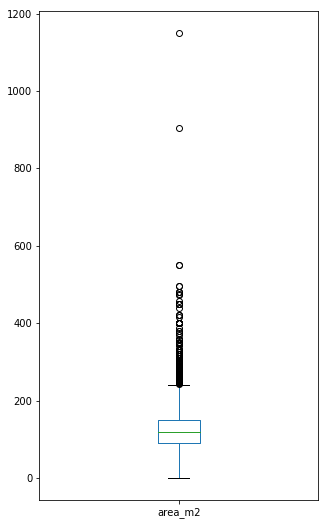

In [51]:
df["area_m2"].plot(kind='box', figsize=(5,9))

In [52]:
df[df['area_m2']<20]

,location,floor,title,price,age,area_m2,owner,room,seller,date
767,beyoglu,upper,"KAMERA EMLAK LTD\u0027 den MERKEZDE, EŞYALI 2+1",1500,30.0,1.0,Emlakçıdan,2+1,Kurumsal,06.12.2018
2251,kagithane,ground floor,EFE REAL\u0027DEN DOLMUS DURAKLARIN YAKIN2+1 75M21.KAT 1600TL,1450,2.0,7.0,Emlakçıdan,2+1,Kurumsal,28.11.2018
3115,atasehir,upper,EVAXyk GAYRİMENKUL\u0027DEN 1+0 DENİZ MANZARALI KİRALIK DAİRE,650,4.0,15.0,Emlakçıdan,1+0,Kurumsal,10.11.2018
4781,beyoglu,underground floor,Beyoğlu 2+1,2700,50.0,5.0,Emlakçıdan,2+1,Bireysel,06.12.2018
5388,atasehir,ground floor,ASIA EMLAKTAN KAYIŞDAĞI CADDESİNE YAKIN İÇİ TEMİZ 3+1,1100,8.0,1.0,Emlakçıdan,3+1,Kurumsal,21.11.2018
6040,sariyer,ground floor,Aileye HacıosmanMetroya 3 Dakika Mesafede Kiralık 90m2 2+1 Daire,1000,15.0,8.0,Emlakçıdan,2+1,Kurumsal,09.12.2018


In [53]:
df.describe()

,price,age,area_m2
count,7968.000000,7964.000000,7968.000000
mean,3714.004267,14.646660,127.308860
std,4942.786025,13.458704,59.304486
min,164.000000,0.000000,1.000000
25%,1500.000000,3.000000,90.000000
50%,2100.000000,13.000000,120.000000
75%,3500.000000,25.000000,150.000000
max,67000.000000,140.000000,1150.000000


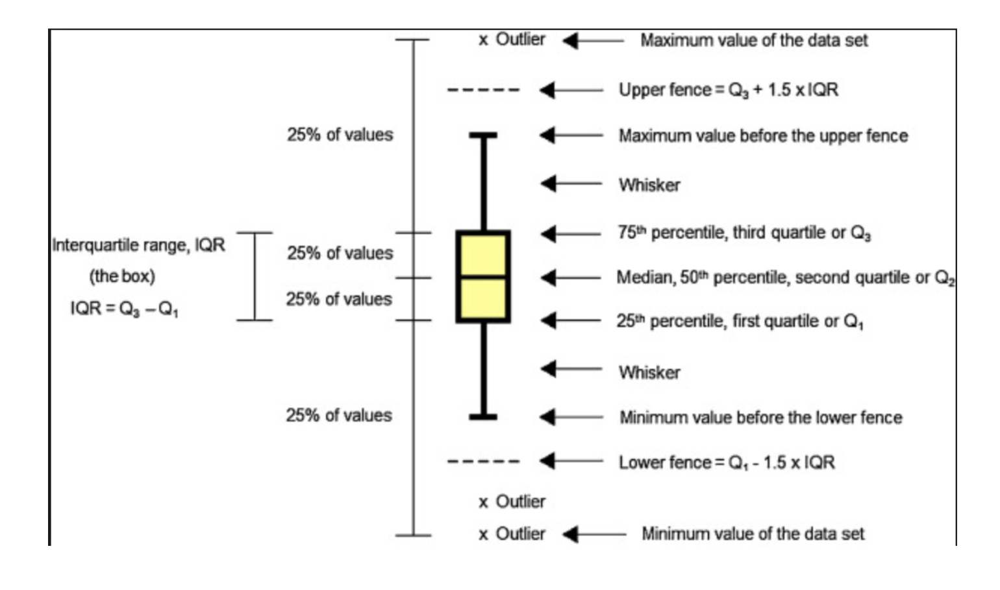

* IQR = 150 - 90 = 60
* Upper Fence = 150 + 1.5 * 60 = 240
* Lower Fence = 90 - 1.5 * 60 = 0

In [54]:
# According to the stat values,there are 367 outliers
(df['area_m2']>240).sum()

367

In [55]:
Q1 = df.area_m2.quantile(0.25)
Q3 = df.area_m2.quantile(0.75)
IQR = Q3 - Q1
df[(df.area_m2 < (Q1 - 1.5 * IQR)) | (df.area_m2 > (Q3 + 1.5 * IQR))]

,location,floor,title,price,age,area_m2,owner,room,seller,date
4,beylikduzu,upper,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2500,7.0,330.0,Emlakçıdan,5+2,Kurumsal,09.12.2018
8,sariyer,upper,"MASHATTAN KIRALIK DAIRE, 4+1 GENIS MANZARALI RESIDENCE",9500,9.0,255.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
14,kadikoy,upper,ERENKÖY SAHİLDE AKTÜEL\u0027DEN 250 M2 DENİZ MANZARALI GÜVENLİKLİ 4+1,9500,30.0,250.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
18,besiktas,upper,ETİLER KİRALIK BADUR SİTESİ 5+1 ÇATI DUBLEX,16000,10.0,284.0,Emlakçıdan,5+1,Kurumsal,09.12.2018
20,cekmekoy,upper,RAPSODİ EVLERİ KİRALIK 4+1 DUBLEKS DAİRE..TEK YETKİLİ ÖZLEM AKSU,5350,10.0,245.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
21,beykoz,ground floor,Beykoz Anadoluhisarı Yeni Sitede Kiralık Sıfır SON Bahçe Dubleks,10000,4.0,300.0,Emlakçıdan,5+1,Kurumsal,09.12.2018
23,sisli,upper,MAÇKADA KİRALIK DENİZ MANZARALI 4+1 DAİRE,16000,35.0,250.0,Emlakçıdan,4+1,Kurumsal,09.12.2018
26,besiktas,upper,ETİLER KİRALIK BADUR SİTESİ 5+1 ÇATI DUBLEX,16000,10.0,284.0,Emlakçıdan,5+1,Kurumsal,09.12.2018
33,besiktas,ground floor,ETİLER KİRALIK BADUR SİTESİNDE 5+1 BAHÇE DUBLEX,15000,10.0,284.0,Emlakçıdan,5+1,Kurumsal,09.12.2018
42,bakirkoy,upper,ARTIDAN FLORYADA KİRALIK HAVUZLU 4+1 ARA KAT,6500,18.0,250.0,Emlakçıdan,4+1,Kurumsal,01.12.2018


In [56]:
df["area_m2"].value_counts(bins=50).sort_index(ascending=True)
# (-0.15, 23.98], (460.6, 483.58] and above seem outliers.

(-0.15, 23.98]        8   
(23.98, 46.96]        89  
(46.96, 69.94]        525 
(69.94, 92.92]        1905
(92.92, 115.9]        1378
(115.9, 138.88]       1543
(138.88, 161.86]      1107
(161.86, 184.84]      370 
(184.84, 207.82]      328 
(207.82, 230.8]       259 
(230.8, 253.78]       172 
(253.78, 276.76]      66  
(276.76, 299.74]      42  
(299.74, 322.72]      86  
(322.72, 345.7]       12  
(345.7, 368.68]       42  
(368.68, 391.66]      5   
(391.66, 414.64]      9   
(414.64, 437.62]      4   
(437.62, 460.6]       7   
(460.6, 483.58]       5   
(483.58, 506.56]      2   
(506.56, 529.54]      0   
(529.54, 552.52]      2   
(552.52, 575.5]       0   
(575.5, 598.48]       0   
(598.48, 621.46]      0   
(621.46, 644.44]      0   
(644.44, 667.42]      0   
(667.42, 690.4]       0   
(690.4, 713.38]       0   
(713.38, 736.36]      0   
(736.36, 759.34]      0   
(759.34, 782.32]      0   
(782.32, 805.3]       0   
(805.3, 828.28]       0   
(828.28, 851.26]      0   
(

#### Owner

In [57]:
df["owner"].value_counts()

Emlakçıdan            7867
Sahibinden            99  
İnşaat Firmasından    2   
Name: owner, dtype: int64

In [58]:
# We can categorize this feature.
labels = df['owner'].astype('category').cat.categories.tolist()
replace_map_comp = {'owner' : {k: v for k,v in zip(labels,list(range(1,len(labels)+1)))}}
replace_map_comp

{'owner': {'Emlakçıdan': 1, 'Sahibinden': 2, 'İnşaat Firmasından': 3}}

In [59]:
df.replace(replace_map_comp,inplace=True)

In [60]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11650,3.0,210.0,1,4+1,Kurumsal,09.12.2018
1,besiktas,ground floor,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13500,4.0,110.0,1,2+1,Kurumsal,09.12.2018
2,besiktas,ground floor,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22000,40.0,120.0,1,2+1,Kurumsal,09.12.2018
3,fatih,upper,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1400,35.0,80.0,1,2+1,Kurumsal,09.12.2018
4,beylikduzu,upper,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2500,7.0,330.0,1,5+2,Kurumsal,09.12.2018


In [61]:
df.owner = df.owner.astype('category')

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null int64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null category
room        7968 non-null object
seller      7968 non-null object
date        7968 non-null object
dtypes: category(1), float64(2), int64(1), object(6)
memory usage: 630.4+ KB


#### Room

In [63]:
df["room"].value_counts()

3+1     2872
2+1     2789
1+1     1067
4+1     723 
5+1     161 
1+0     103 
4+2     75  
3+2     52  
5+2     41  
2+2     23  
6+1     20  
6+2     16  
7+1     5   
3+0     3   
3+3     3   
2+0     2   
7+2     2   
1+4     2   
10+0    2   
1+3     1   
3+27    1   
10+1    1   
2+80    1   
2+21    1   
4+0     1   
3+35    1   
Name: room, dtype: int64

In [64]:
# Convert number of rooms to one number 
def sum_room (data_series):
    df1 = data_series.str.partition('+')
    df1.loc[:,0] = df1.loc[:,0].astype('int64')
    df1.loc[:,2] = df1.loc[:,2].astype('int64')
    df['room'] = df1.loc[:,0]+df1.loc[:,2]
    return df.room
    
sum_room(df.room)

0       5 
1       3 
2       3 
3       3 
4       7 
5       5 
6       4 
7       4 
8       5 
9       4 
10      4 
11      4 
12      2 
13      2 
14      5 
15      5 
16      4 
17      4 
18      6 
19      2 
20      5 
21      6 
22      4 
23      5 
24      1 
25      3 
26      6 
27      5 
28      5 
29      4 
30      5 
31      5 
32      2 
33      6 
34      4 
35      3 
36      3 
37      4 
38      5 
39      4 
40      5 
41      2 
42      5 
43      3 
44      3 
45      2 
46      4 
47      3 
48      5 
49      4 
50      2 
51      2 
52      2 
53      3 
54      4 
55      3 
56      4 
57      4 
58      3 
59      4 
61      3 
62      4 
63      3 
64      3 
65      3 
66      2 
67      4 
68      4 
69      3 
70      4 
71      8 
72      4 
73      3 
74      4 
75      4 
76      4 
77      3 
78      3 
79      3 
80      2 
81      4 
82      3 
83      4 
84      4 
85      2 
86      3 
87      4 
88      3 
89      3 
90      2 
91      3 

In [65]:
df.head(2)

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11650,3.0,210.0,1,5,Kurumsal,09.12.2018
1,besiktas,ground floor,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13500,4.0,110.0,1,3,Kurumsal,09.12.2018


In [66]:
df["room"].value_counts()

4     2897
3     2792
2     1069
5     777 
6     239 
1     103 
7     61  
8     21  
10    2   
9     2   
23    1   
11    1   
82    1   
38    1   
30    1   
Name: room, dtype: int64

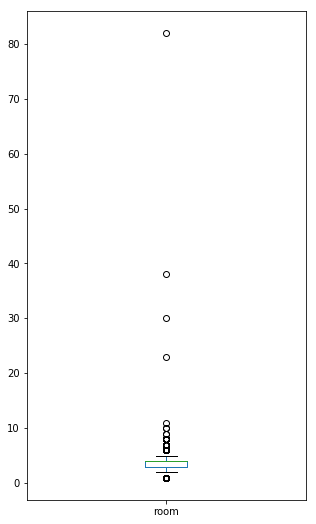

In [67]:
df["room"].plot(kind='box', figsize=(5,9))

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null int64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null category
room        7968 non-null int64
seller      7968 non-null object
date        7968 non-null object
dtypes: category(1), float64(2), int64(2), object(5)
memory usage: 630.4+ KB


#### Seller

In [69]:
df["seller"].value_counts()

Kurumsal    6311
Bireysel    1657
Name: seller, dtype: int64

In [70]:
pattern = {'seller': {'Kurumsal': 1, 'Bireysel': 2}}
df.replace(pattern, inplace=True)

In [71]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,Besiktas Modern Eşyalı 4+1 Kiralık Daire (129),11650,3.0,210.0,1,5,1,09.12.2018
1,besiktas,ground floor,Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194),13500,4.0,110.0,1,3,1,09.12.2018
2,besiktas,ground floor,Bebek\u0027te Manzaralı Kiralık Yalı Dairesi,22000,40.0,120.0,1,3,1,09.12.2018
3,fatih,upper,BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri,1400,35.0,80.0,1,3,1,09.12.2018
4,beylikduzu,upper,Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks,2500,7.0,330.0,1,7,1,09.12.2018


In [72]:
df.seller = df.seller.astype('category')

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null int64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null category
room        7968 non-null int64
seller      7968 non-null category
date        7968 non-null object
dtypes: category(2), float64(2), int64(2), object(4)
memory usage: 576.0+ KB


#### Date

In [74]:
# We convert this feature to datetime,
df['date'] = pd.to_datetime(df['date'], format=('%d.%m.%Y'))

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7968 entries, 0 to 7979
Data columns (total 10 columns):
location    7968 non-null object
floor       7753 non-null object
title       7968 non-null object
price       7968 non-null int64
age         7964 non-null float64
area_m2     7968 non-null float64
owner       7968 non-null category
room        7968 non-null int64
seller      7968 non-null category
date        7968 non-null datetime64[ns]
dtypes: category(2), datetime64[ns](1), float64(2), int64(2), object(3)
memory usage: 576.0+ KB


In [76]:
df.date.value_counts(dropna=False).sort_index(ascending=False)

2018-12-09    1081
2018-12-08    1676
2018-12-07    1091
2018-12-06    769 
2018-12-05    629 
2018-12-04    677 
2018-12-03    466 
2018-12-02    115 
2018-12-01    94  
2018-11-30    90  
2018-11-29    105 
2018-11-28    96  
2018-11-27    75  
2018-11-26    111 
2018-11-25    16  
2018-11-24    55  
2018-11-23    58  
2018-11-22    102 
2018-11-21    83  
2018-11-20    98  
2018-11-19    60  
2018-11-18    24  
2018-11-17    33  
2018-11-16    41  
2018-11-15    60  
2018-11-14    39  
2018-11-13    43  
2018-11-12    82  
2018-11-11    9   
2018-11-10    31  
2018-11-09    58  
2018-11-07    1   
Name: date, dtype: int64

In [77]:
#Howmany days has our dataset?
df.date.dt.weekday_name.value_counts()

Saturday     1889
Friday       1338
Sunday       1245
Thursday     1036
Tuesday      893 
Wednesday    848 
Monday       719 
Name: date, dtype: int64

In [78]:
(df.date.max()-df.date.min()).days

32

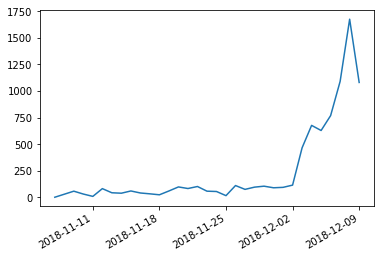

In [79]:
df.date.value_counts().sort_index().plot()

#### Title

In [80]:
df.iloc[0:5,2]

0    Besiktas Modern Eşyalı 4+1 Kiralık Daire (129)                  
1    Ulus Savoy Eşyalı Şehir Manzaralı 2+1 Kiralik Daire (194)       
2    Bebek\u0027te Manzaralı Kiralık Yalı Dairesi                    
3    BAŞVEKİL EMLAKTAN SEYİTÖMERDE KİRALIK 2+1 TEMİZ DAİRE Favorileri
4    Beylikdüzü Beykent Osmanlı Caddesinde Sıfır 5+2 Dubleks         
Name: title, dtype: object

In [81]:
# Wecan make all the value lowercase.
df.title=df.title.str.lower()

In [82]:
df.title = df.title.str.replace('kiralik daire' , '', flags = re.IGNORECASE)

In [83]:
df.title = df.title.str.replace('\d','')

In [84]:
df.head()

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,besiktas modern eşyalı + (),11650,3.0,210.0,1,5,1,2018-12-09
1,besiktas,ground floor,ulus savoy eşyalı şehir manzaralı + (),13500,4.0,110.0,1,3,1,2018-12-09
2,besiktas,ground floor,bebek\ute manzaralı kiralık yalı dairesi,22000,40.0,120.0,1,3,1,2018-12-09
3,fatih,upper,başveki̇l emlaktan seyi̇tömerde ki̇ralik + temi̇z dai̇re favorileri,1400,35.0,80.0,1,3,1,2018-12-09
4,beylikduzu,upper,beylikdüzü beykent osmanlı caddesinde sıfır + dubleks,2500,7.0,330.0,1,7,1,2018-12-09


In [85]:
# remove all characters except letters belonging to english alphabet, spaces and tabs
df.title = df.title.str.replace('[^A-Za-z0-9şığöçü\s]+', '')

In [86]:
df

,location,floor,title,price,age,area_m2,owner,room,seller,date
0,besiktas,upper,besiktas modern eşyalı,11650,3.0,210.0,1,5,1,2018-12-09
1,besiktas,ground floor,ulus savoy eşyalı şehir manzaralı,13500,4.0,110.0,1,3,1,2018-12-09
2,besiktas,ground floor,bebekute manzaralı kiralık yalı dairesi,22000,40.0,120.0,1,3,1,2018-12-09
3,fatih,upper,başvekil emlaktan seyitömerde kiralik temiz daire favorileri,1400,35.0,80.0,1,3,1,2018-12-09
4,beylikduzu,upper,beylikdüzü beykent osmanlı caddesinde sıfır dubleks,2500,7.0,330.0,1,7,1,2018-12-09
5,besiktas,ground floor,yeni ulus sitesiunde havuzbaşi konumda firsat daire,7250,23.0,223.0,1,5,1,2018-12-09
6,sariyer,upper,maslak mashattan modern eşyalı,8150,12.0,170.0,1,4,1,2018-12-09
7,sariyer,upper,maslak mashattan kiralık residence kat manzara u ankastre,6000,9.0,170.0,1,4,1,2018-12-09
8,sariyer,upper,mashattan genis manzarali residence,9500,9.0,255.0,1,5,1,2018-12-09
9,kadikoy,upper,kozyataği sifir kombi spotişik klima panjur şikbanyolu şikmu,2300,0.0,90.0,1,4,2,2018-12-09


### In summary, we are going to:
1. outliers in area_m2 and room columns.
2. missing values in floor and age.

### Working with Outliers: Correcting, Removing
* During data analysis when you detect the outlier one of most difficult decision could be how one should deal with the outlier. Should they remove them or correct them? 

In [105]:
from scipy import stats
z = np.abs(stats.zscore(df.area_m2))
df.area_m2[(z>3)].count()
# According to the z score there are too many outliers. But if we look at the data set,
# this is not normal, so we can deal with the outliers as   above.

117

In [106]:
df = df.drop(df[(df.area_m2<23.98) | (df.area_m2>460.6) ].index) 

In [107]:
df.shape

(7949, 10)

In [111]:
z1 = np.abs(stats.zscore(df.room))
df.room[(z1>3)].count()
#But it is possible 8-rooms-house, so we can remove 9 and above.

26

In [112]:
df = df.drop(df[df.room>8].index)

In [113]:
df.shape

(7941, 10)